<a href="https://colab.research.google.com/github/asedaama/Facility-location-prediction/blob/main/kmeans_target.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Pandas and numpy for data manipulation
import pandas as pd
import numpy as np
np.random.seed(8)
import streamlit as st
# Matplotlib and seaborn for plotting 
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['font.size'] = 24
matplotlib.rcParams['figure.figsize'] = (16,9)
plt.style.use('ggplot')

import seaborn as sns

from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df= pd.read_csv('C://Users//antwi//OneDrive//Desktop//TARGET.csv',encoding='latin-1')

In [ ]:
df.head()

,X.locale,Address.AddressLine1,Address.AddressLine2,Address.City,Address.CountryName,Address.County,Address.FormattedAddress,Address.IntersectionDescription,Address.Latitude,Address.Longitude,...,Is24Hours.Sat,IsOpen.Sat,Summary.Sat,ThruTime.Sat,BeginTime.Sun,Is24Hours.Sun,IsOpen.Sun,Summary.Sun,ThruTime.Sun,AllCapability
0,en-US,400 Oxford Exchange Blvd,NaN,Oxford,United States,Calhoun,"400 Oxford Exchange Blvd, Oxford, AL 36203-3459",SEC I-20 & Golden Creek Rd,33.608825,-85.783182,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Café', 'Mobile Kiosk', 'Star..."
1,en-US,2640 Enterprise Dr,NaN,Opelika,United States,Lee,"2640 Enterprise Dr, Opelika, AL 36801-1511",NWC I-85 & Hwy 280,32.618108,-85.410636,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Cafe-Pizza', 'Fresh Grocery'..."
2,en-US,1129 S Park St,NaN,Carrollton,United States,Carroll,"1129 S Park St, Carrollton, GA 30117-4429",NWC US 27 & Hwy 166 Bypass,33.558920,-85.076473,...,False,True,8:00 a.m.-10:00 p.m.,22:00:00,8:00:00,False,True,8:00 a.m.-9:00 p.m.,21:00:00,NaN
3,en-US,555 Bullsboro Dr,NaN,Newnan,United States,Coweta,"555 Bullsboro Dr, Newnan, GA 30265-1045",SWC I-85 & Rte 34,33.392907,-84.758875,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Café', 'Fresh Grocery', 'Mob..."
4,en-US,1591 Bradley Park Dr,NaN,Columbus,United States,Muscogee,"1591 Bradley Park Dr, Columbus, GA 31904-3071",NEC Bradley Pk & JR Allen Pkwy,32.534649,-84.971073,...,False,True,8:00 a.m.-11:00 p.m.,23:00:00,8:00:00,False,True,8:00 a.m.-10:00 p.m.,22:00:00,"['CVS pharmacy', 'Café', 'Mobile Kiosk', 'Phot..."


In [ ]:
df.shape

(1829, 47)

In [ ]:
df.columns

Index(['X.locale', 'Address.AddressLine1', 'Address.AddressLine2',
       'Address.City', 'Address.CountryName', 'Address.County',
       'Address.FormattedAddress', 'Address.IntersectionDescription',
       'Address.Latitude', 'Address.Longitude', 'Address.PostalCode',
       'Address.Subdivision', 'AlternateIdentifier.ID', 'ID',
       'IsDaylightSavingsTimeRecognized', 'LocationMilestones.LastRemodelDate',
       'LocationMilestones.OpenDate', 'Market', 'Name',
       'OperatingHours..timeFormat', 'Store.StoreDistrictID',
       'Store.StoreGroupID', 'Store.StoreRegionID', 'SubTypeDescription',
       'TimeZone.TimeZoneCode', 'TimeZone.TimeZoneDescription',
       'TimeZone.TimeZoneOffset.OffsetCode',
       'TimeZone.TimeZoneOffset.OffsetHours', 'TypeCode', 'PhoneNumber',
       'FaxNumber', 'BeginTime.MF', 'Is24Hours.MF', 'IsOpen.MF', 'Summary.MF',
       'ThruTime.MF', 'BeginTime.Sat', 'Is24Hours.Sat', 'IsOpen.Sat',
       'Summary.Sat', 'ThruTime.Sat', 'BeginTime.Sun', 'Is24Hour

In [ ]:
df = df[['Address.Latitude','Address.Longitude','ID','Address.FormattedAddress','Address.Subdivision','PhoneNumber']]

In [ ]:
df.describe()

,Address.Latitude,Address.Longitude,ID
count,1829.000000,1829.000000,1829.000000
mean,37.618538,-93.586666,1571.299617
std,5.203413,16.684875,776.198631
min,19.648413,-158.092822,3.000000
25%,33.853038,-106.077670,993.000000
50%,38.579381,-88.200911,1484.000000
75%,41.561322,-80.599357,2191.000000
max,61.578202,-68.741560,3295.000000


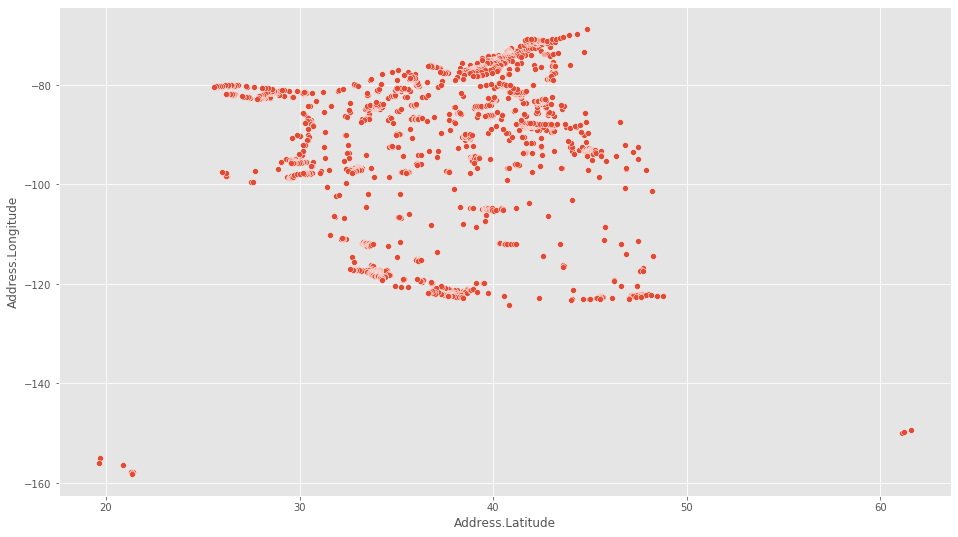

In [ ]:
sns.scatterplot(data=df, x = 'Address.Latitude' , y = 'Address.Longitude')

In [ ]:
import plotly.graph_objects as go

df['text'] = df['Address.FormattedAddress'] +'Phone Number:'+ df['PhoneNumber'].astype(str)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = df['Address.Longitude'],
        lat = df['Address.Latitude'],
        text = df['text'],
        mode = 'markers',
        marker = dict(
            opacity = 0.8,
            reversescale=True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Blues',
            cmin = 0,
            color = df['ID'],
            cmax = df['ID'].max(),
        )))

fig.update_layout(
        title = 'Target location in USA<br>',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True
        ),
    )
fig.show()

2021-07-12 11:30:18.110 INFO    numexpr.utils: NumExpr defaulting to 6 threads.


In [ ]:
import folium
import re

In [ ]:
m= folium.Map(location=[df['Address.Latitude'].mean(),df['Address.Longitude'].mean()],zoom_start=4,
             tiles='openstreetmap')
for _, row in df.iterrows():
    folium.CircleMarker(
    location=[row['Address.Latitude'],row['Address.Longitude']],
    radius=5,
    popup = re.sub(r'[^a-zA-Z]+','',row['Address.FormattedAddress']),
    color='#1787FE',
    fill=True,
    fill_color='#1787FE').add_to(m)
m

In [ ]:
# need to drop the Address.name column
df = df[['Address.Latitude','Address.Longitude','ID']]

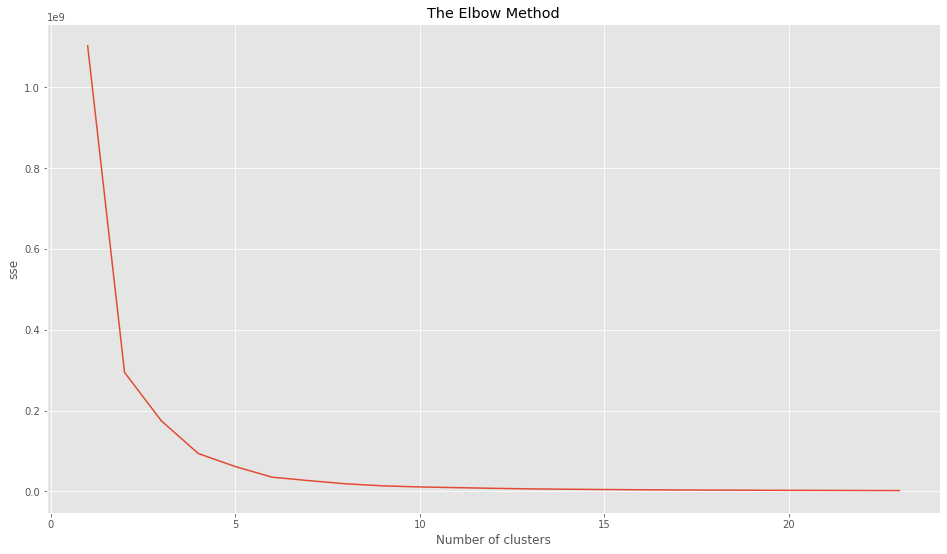

In [ ]:
# determining the k using the elbow method 
#from the graph k = 6
SSE = []

for i in range (1,24):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10,random_state = 0)
    kmeans.fit(df)
    SSE.append(kmeans.inertia_)

    
plt.plot(range(1,24),SSE)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('sse')
plt.show()

In [ ]:
from scipy.spatial.distance import cdist
import random

In [ ]:
def k_means(X, K):
#Keep track of history so you can see k-means in action
    centroids_history = []
    labels_history = []
    rand_index = np.random.choice(X.shape[0], K)
    centroids = X[rand_index]
    centroids_history.append(centroids)
    while True:
# Euclidean distances are calculated for each point relative to
# centroids, #and then np.argmin returns
# the index location of the minimal distance - which cluster a point
# is #assigned to
        labels = np.argmin(cdist(X, centroids), axis=1)
        labels_history.append(labels)
#Take mean of points within clusters to find new centroids:
        new_centroids = np.array([X[labels == i].mean(axis=0)
                                  for i in range(K)])
        centroids_history.append(new_centroids)
        
# If old centroids and new centroids no longer change, k-means is
# complete and end. Otherwise continue
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids
    
    return centroids, labels, centroids_history, labels_history

In [ ]:
df = df.values

In [ ]:
centroids, labels, centroids_history, labels_history = k_means(df, 6)

In [ ]:
centroids

array([[  37.21999701,  -91.59642056, 2080.72361809],
       [  37.97347688, -106.73173206,  232.0982659 ],
       [  38.20356509,  -87.02327718, 1106.44280443],
       [  37.61538443,  -91.89243279, 1403.22661871],
       [  37.57156207,  -95.38420357, 2751.6328125 ],
       [  37.74013341,  -96.35669119,  776.38188976]])

In [ ]:
labels

array([0, 3, 2, ..., 4, 4, 0], dtype=int64)

In [ ]:
df = pd.DataFrame(df,columns =['Address.Latitude','Address.Longitude','ID'])

In [ ]:
df.head()

,Address.Latitude,Address.Longitude,ID
0,33.608825,-85.783182,2153.0
1,32.618108,-85.410636,1499.0
2,33.558920,-85.076473,1073.0
3,33.392907,-84.758875,1223.0
4,32.534649,-84.971073,1179.0


In [ ]:
df['cluster']= labels

In [ ]:
df.head()

,Address.Latitude,Address.Longitude,ID,cluster
0,33.608825,-85.783182,2153.0,0
1,32.618108,-85.410636,1499.0,3
2,33.558920,-85.076473,1073.0,2
3,33.392907,-84.758875,1223.0,2
4,32.534649,-84.971073,1179.0,2


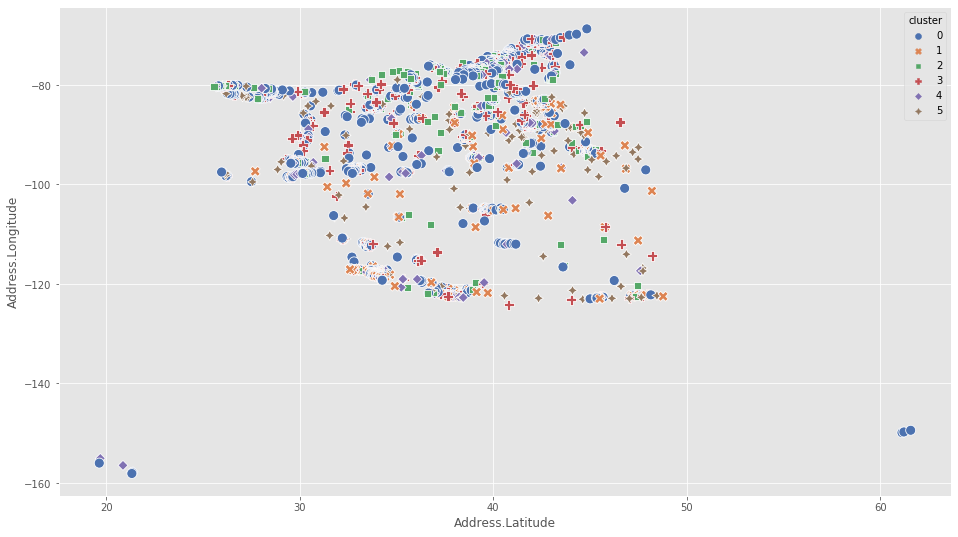

In [ ]:
sns.scatterplot(data = df, x = 'Address.Latitude', y = 'Address.Longitude', hue = 'cluster',style = "cluster", palette="deep", s = 100)

In [ ]:
k = 6
centroids
lats = [centroids[i][0] for i in range(k)]
df['clat'] = df['cluster'].map(lambda x: lats[x])
longs = [centroids[i][1] for i in range(k)]
df['clong'] = df['cluster'].map(lambda x: longs[x])
df.head()

,Address.Latitude,Address.Longitude,ID,cluster,clat,clong
0,33.608825,-85.783182,2153.0,0,37.219997,-91.596421
1,32.618108,-85.410636,1499.0,3,37.615384,-91.892433
2,33.558920,-85.076473,1073.0,2,38.203565,-87.023277
3,33.392907,-84.758875,1223.0,2,38.203565,-87.023277
4,32.534649,-84.971073,1179.0,2,38.203565,-87.023277


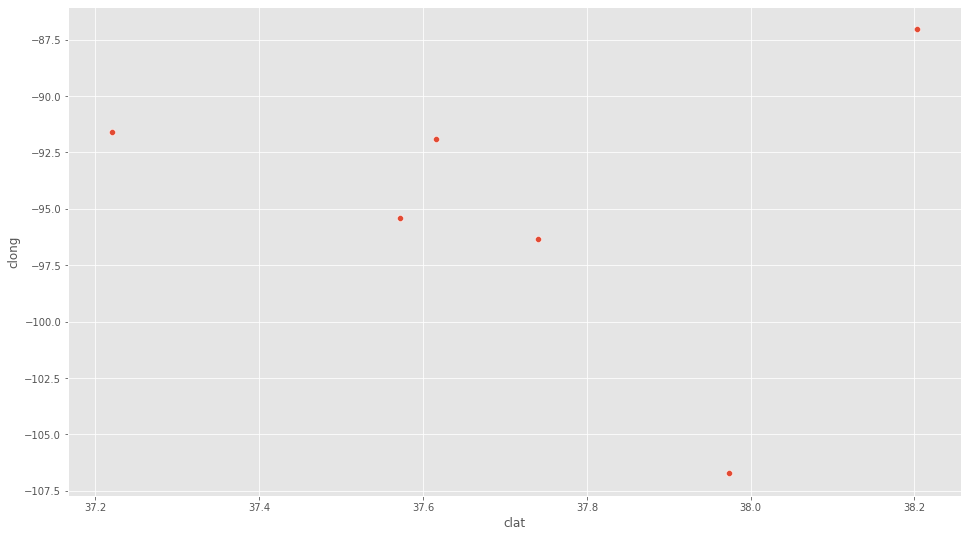

In [ ]:
sns.scatterplot(data=df, x = 'clat' , y = 'clong')

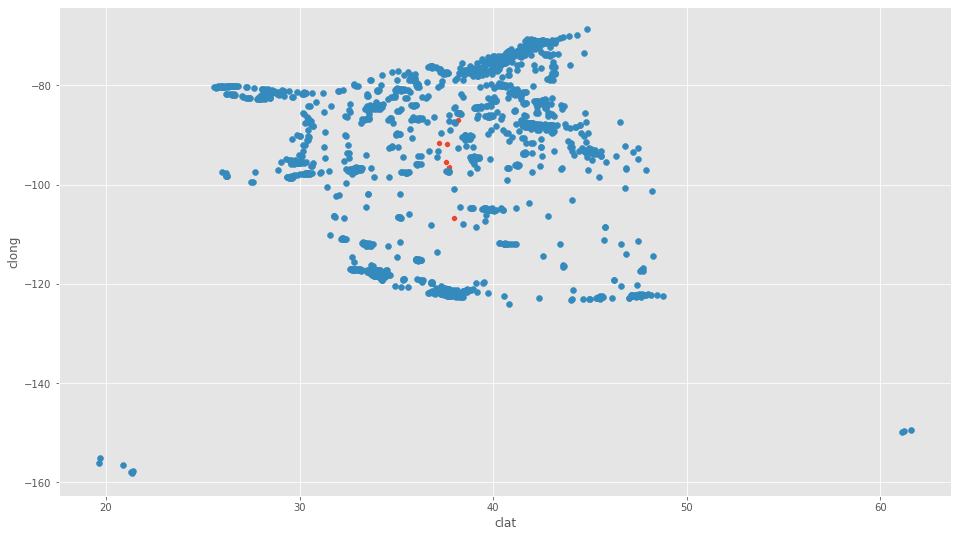

In [ ]:
sns.scatterplot(data=df, x = 'clat' , y = 'clong')
plt.scatter(data=df, x = 'Address.Latitude' , y = 'Address.Longitude')

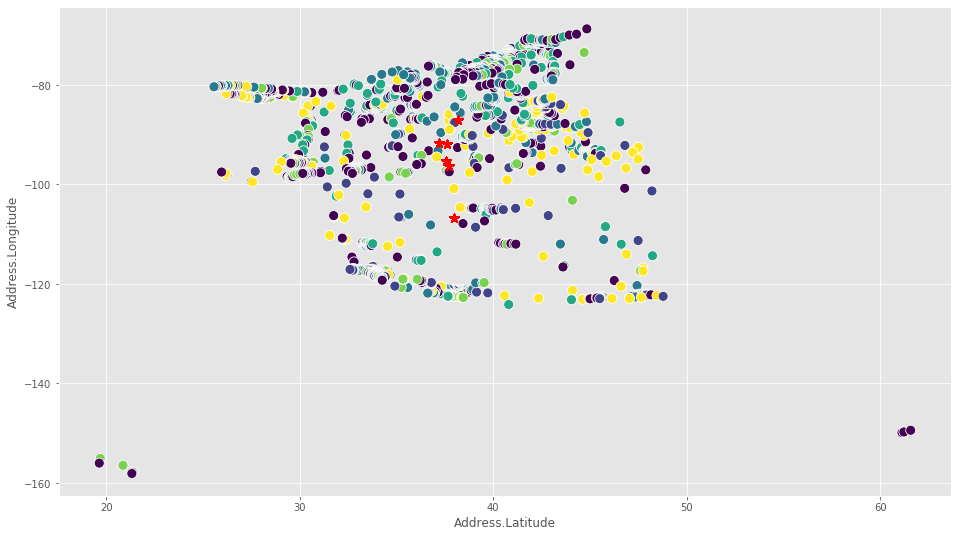

In [ ]:
sns.scatterplot(df['Address.Latitude'],df['Address.Longitude'], c =df['cluster'], s = 100)
plt.scatter(df['clat'],df['clong'], marker ='*', s = 100, c= 'red')

In [ ]:
m1= folium.Map(location=[df['clat'].mean(),df['clong'].mean()],zoom_start=4,
             tiles='openstreetmap')
for _, row in df.iterrows():
    folium.Marker(
    location=[row['clat'],row['clong']],
    popup = row['cluster'],
    color='#1787FE',
    fill=True,
    fill_color='#1787FE').add_to(m1)
m1

In [ ]:
from sklearn.metrics import silhouette_score

In [ ]:
print(f'Silhouette Score: {silhouette_score(df, labels)}')

Silhouette Score: 0.5576613827911687


In [ ]:
import geopandas as gpd
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import tqdm
from tqdm.notebook import tqdm

In [ ]:
df['geom'] = df['clat'].map(str) + ',' + df['clong'].map(str)
df['geom'][0]

'37.21999700502512,-91.59642055611397'

In [ ]:
locator = Nominatim(user_agent='myGeocoder', timeout=10)
rgeocode = RateLimiter(locator.reverse, min_delay_seconds=0.001)

In [ ]:
tqdm.pandas()

df['address'] = df['geom'].progress_apply(rgeocode)
df.head()

,Address.Latitude,Address.Longitude,ID,cluster,clat,clong,geom,address
0,33.608825,-85.783182,2153.0,0,37.219997,-91.596421,"37.21999700502512,-91.59642055611397","(Shannon County, Missouri, United States, (37...."
1,32.618108,-85.410636,1499.0,3,37.615384,-91.892433,"37.61538443165467,-91.89243279136686","(Phelps County, Missouri, United States, (37.9..."
2,33.558920,-85.076473,1073.0,2,38.203565,-87.023277,"38.203565088560886,-87.02327718081179","(6085, West 1200 South, Warrick County, Indian..."
3,33.392907,-84.758875,1223.0,2,38.203565,-87.023277,"38.203565088560886,-87.02327718081179","(6085, West 1200 South, Warrick County, Indian..."
4,32.534649,-84.971073,1179.0,2,38.203565,-87.023277,"38.203565088560886,-87.02327718081179","(6085, West 1200 South, Warrick County, Indian..."


In [ ]:
df.drop('geom', inplace=True,axis=1)

In [ ]:
df.head()

,Address.Latitude,Address.Longitude,ID,cluster,clat,clong,address
0,33.608825,-85.783182,2153.0,0,37.219997,-91.596421,"(Shannon County, Missouri, United States, (37...."
1,32.618108,-85.410636,1499.0,3,37.615384,-91.892433,"(Phelps County, Missouri, United States, (37.9..."
2,33.558920,-85.076473,1073.0,2,38.203565,-87.023277,"(6085, West 1200 South, Warrick County, Indian..."
3,33.392907,-84.758875,1223.0,2,38.203565,-87.023277,"(6085, West 1200 South, Warrick County, Indian..."
4,32.534649,-84.971073,1179.0,2,38.203565,-87.023277,"(6085, West 1200 South, Warrick County, Indian..."


In [ ]:
m2= folium.Map(location=[df['Address.Latitude'].mean(),df['Address.Longitude'].mean()],zoom_start=4,
             tiles='openstreetmap')
tooltip = 'Click me!'
for _, row in df.iterrows():
    folium.Marker(
    location=[row['clat'],row['clong']],
    popup = row['address'],
    tooltip=tooltip, icon= folium.Icon(color= 'red',icon='info-sign')
    ).add_to(m2)
    folium.Marker(
    location=[row['Address.Latitude'],row['Address.Longitude']],
    popup =[row['Address.Latitude'],row['Address.Longitude']],
    tooltip=tooltip
    ).add_to(m2)
m2